# OpenCV Library


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet. 
Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and the internet.
A digital image is simply a file on your computer. In this lab, you will gain an understanding  of these files and learn to work with these files with some popular libraries


<ul>
    <li><a href='#PIL'>Open CV </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
        </ul>
    </li>
    
</ul>


----


Download the image for the lab:


In [122]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [ ]:
from tkinter import Image #import lớp Image từ thư viện tkinter
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height)) #tạo ảnh mới có chiều rộng bằng tổng hai ảnh và chiều cao bằng ảnh thứ nhất
    dst.paste(im1, (0, 0)) #dán ảnh im1 vào bên trái ảnh mới
    dst.paste(im2, (im1.width, 0)) #dán ảnh im2 vào bên phải ảnh mới
    return dst #trả về ảnh đã được ghép theo chiều ngang

## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [ ]:
my_image = "lenna.png" #gán tên file ảnh "lenna.png" cho biến my_image để sử dụng khi mở hoặc xử lý ảnh

Filename consists of two parts, the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the image. There are two popular image formats -- Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image using sine/cosine approximations, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [46]:
import os #import module os để làm việc với hệ điều hành
cwd = os.getcwd() #lấy đường dẫn thư mục làm việc hiện tại và gán vào biến cwd
cwd  #hiển thị đường dẫn thư mục làm việc hiện tại

'd:\\Learning\\Thị giác máy tính\\Lab1'

The "path" to an image can be found using the following line of code.


In [61]:
#image_path = os.path.join(cwd, my_image)
image_path = "D:\Learning\Thị giác máy tính\Lab1\lenna.png".encode('utf-8').decode() #Gán đường dẫn đầy đủ tới file ảnh lenna.png, đồng thời mã hóa và giải mã UTF-8 để đảm bảo chuỗi Unicode (phù hợp với đường dẫn có ký tự tiếng Việt)
image_path #hiển thị giá trị đường dẫn của biến image_path

'D:\\Learning\\Thị giác máy tính\\Lab1\\lenna.png'

## Load in Image in Python


OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:


In [48]:
import cv2 #import thư viện OpenCV để xử lý ảnh

The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [49]:
image = cv2.imread(my_image) #đọc ảnh từ file my_image và lưu vào biến image

The result is a numpy array with intensity values as 8-bit unsigned integers. 


In [50]:
type(image) #kiểm tra kiểu dữ liệu của biến image

numpy.ndarray

We can get the shape of the array from the `shape` attribute.


In [51]:
image.shape #kiểm tra kích thước của ảnh lưu trong biến image

(512, 512, 3)

The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.


Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. The maximum and minimum intensity values of an image can be obtained, respectively, by calling:


In [52]:
image.max() #kiểm tra giá trị lớn nhất trong mảng ảnh lưu trong biến image

np.uint8(255)

and


In [53]:
image.min() #kiểm tra giá trị nhỏ nhất trong mảng ảnh lưu trong biến image

np.uint8(3)

##  Plotting an Image 


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


In [54]:
#cv2.imshow('image', imgage)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

You can also use the `imshow` function from the `matplotlib` library:


In [55]:
import matplotlib.pyplot as plt #import thư viện matplotlib để hiển thị ảnh

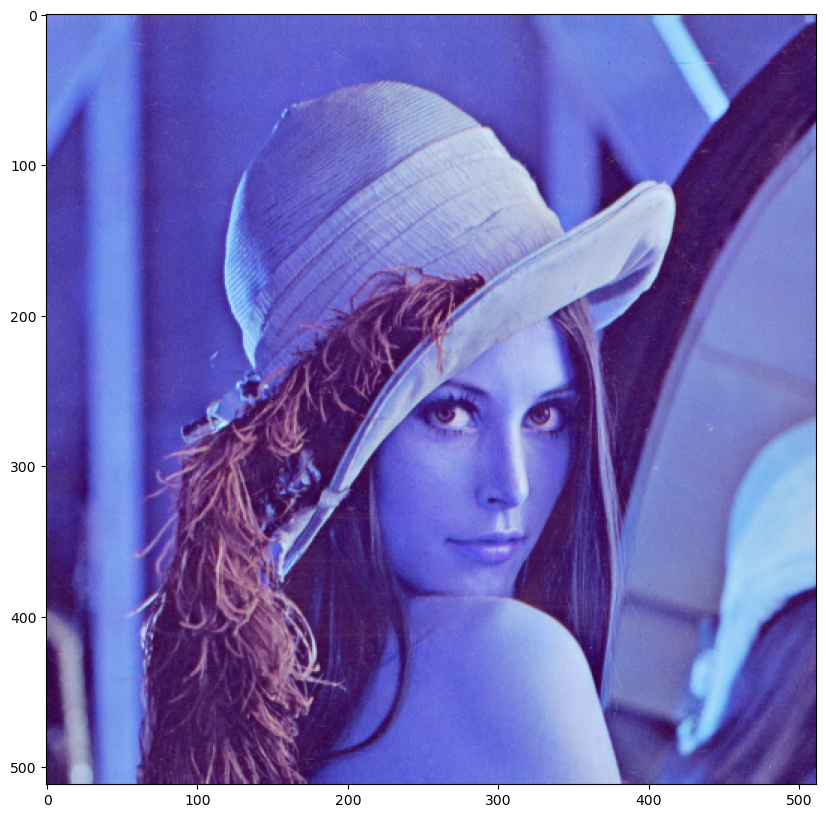

In [56]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(image) #hiển thị ảnh lưu trong biến image
plt.show() #hiển thị figure chứa ảnh

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


In [57]:
new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #chuyển đổi ảnh từ định dạng BGR sang RGB và lưu vào biến new_image

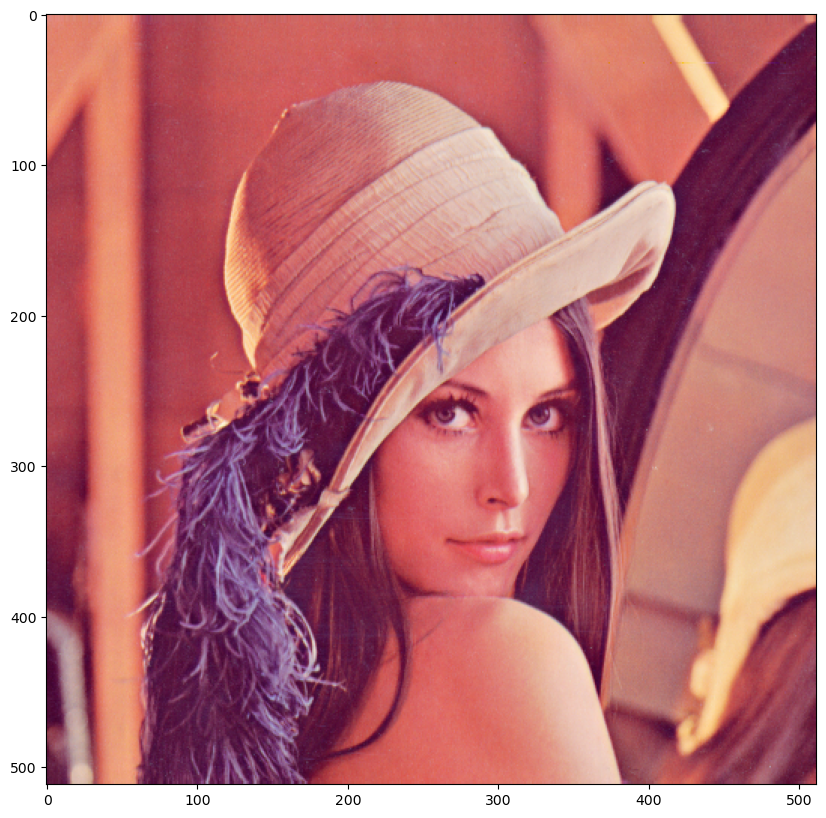

In [58]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(new_image) #hiển thị ảnh lưu trong biến new_image
plt.show() #hiển thị figure chứa ảnh

You can also load the image using its path, this comes in handy if the image is not in your working directory:


In [63]:
image = cv2.imread(my_image) #đọc ảnh từ file my_image và lưu vào biến image
image.shape #kiểm tra kích thước của ảnh lưu trong biến image

(512, 512, 3)

You can save the image as in `jpg` format.


In [64]:
cv2.imwrite("lenna.jpg", image) #lưu ảnh trong biến image vào file lenna.jpg

True

### Grayscale Images


Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #chuyển đổi ảnh từ định dạng BGR sang thang độ xám và lưu vào biến image_gray

The image array has only two dimensions, i.e. only one color channel:


In [66]:
image_gray.shape #kiểm tra kích thước của ảnh lưu trong biến image_gray

(512, 512)

We can plot the image using `imshow` but we have to specify the color map is gray:


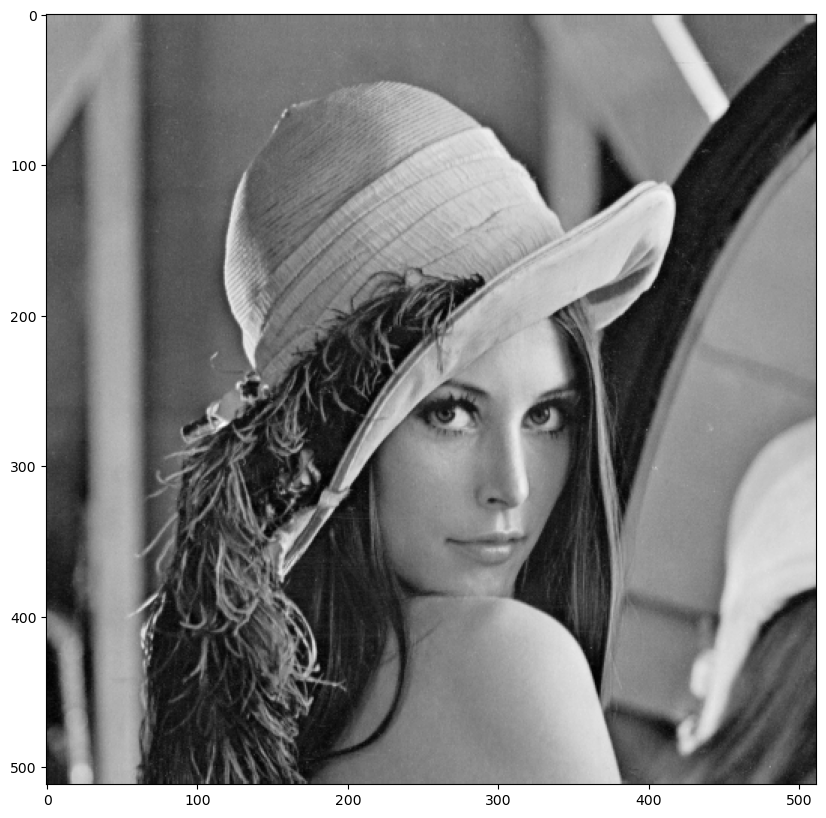

In [ ]:
plt.figure(figsize=(10, 10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(image_gray, cmap='gray') #hiển thị ảnh xám lưu trong biến image_gray với bản đồ màu xám
plt.show() #hiển thị figure chứa ảnh

We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.


In [68]:
cv2.imwrite('lena_gray_cv.jpg', image_gray) #lưu ảnh xám trong biến image_gray vào file lena_gray_cv.jpg

True

You can also load in a grayscale image we have to set <code>flag</code> parameter to gray color conversation code: <code>cv2.COLOR_BGR2GRAY</code>:


In [69]:
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE) #đọc ảnh barbara.png ở định dạng thang độ xám và lưu vào biến im_gray

We can plot the image:


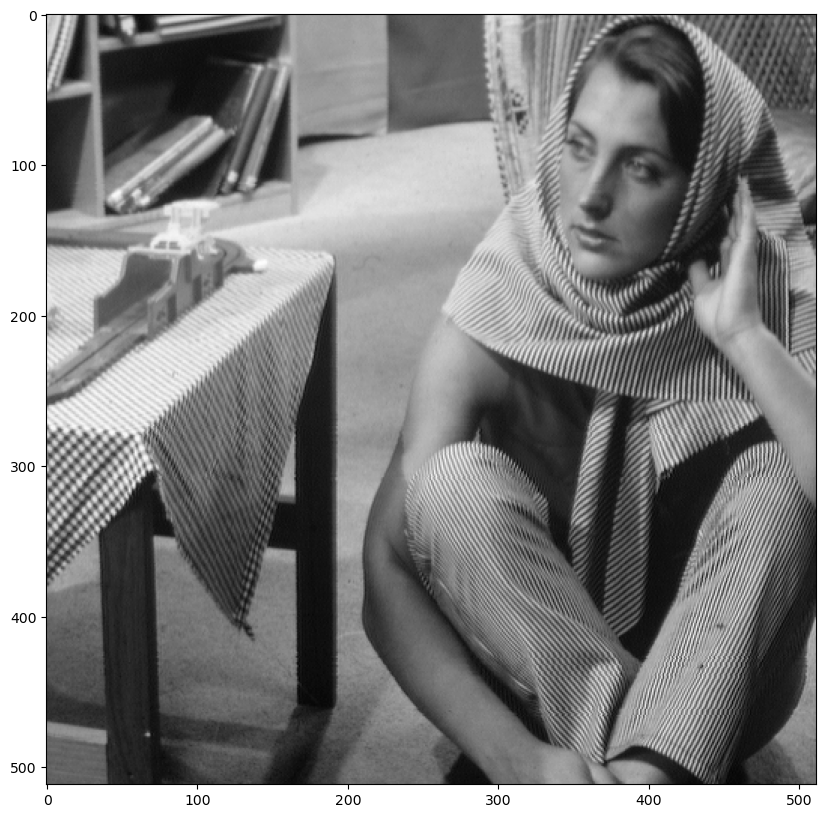

In [ ]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(im_gray,cmap='gray') #hiển thị ảnh xám lưu trong biến im_gray với bản đồ màu xám
plt.show() #hiển thị figure chứa ảnh

### Color Channels  


We can also work with the different color channels. Consider the following image:


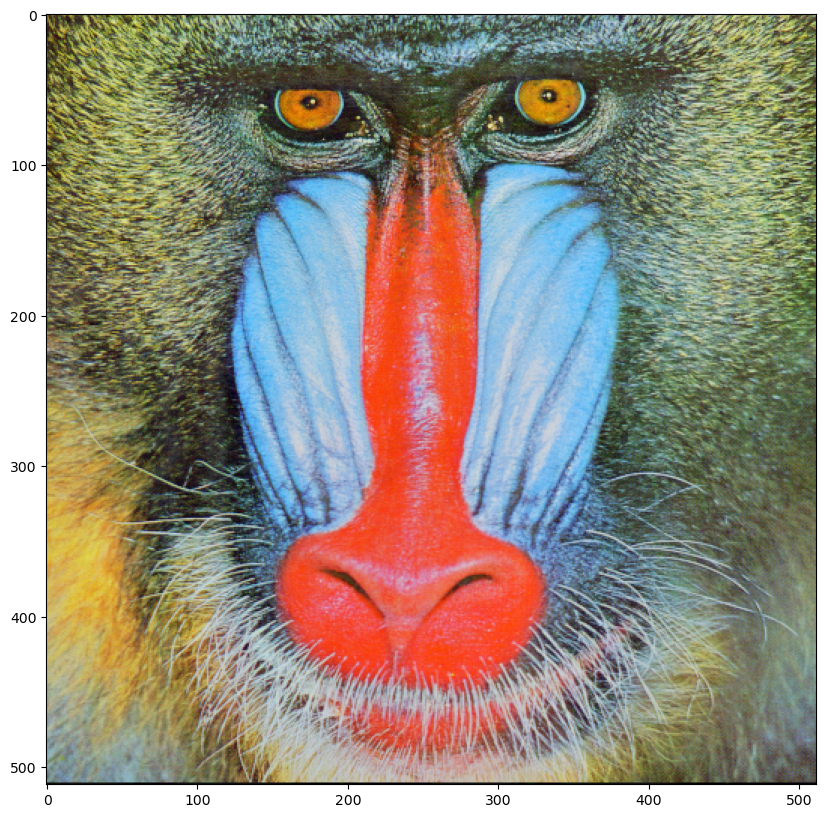

In [ ]:
baboon=cv2.imread('baboon.png') #đọc ảnh baboon.png và lưu vào biến baboon
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon sau khi chuyển đổi từ BGR sang RGB
plt.show() #hiển thị figure chứa ảnh

We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [ ]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2] #tách kênh màu xanh dương, xanh lá và đỏ từ ảnh baboon và lưu vào các biến tương ứng

We can concatenate each image channel the images using the function <code>vconcat</code>.


In [73]:
im_bgr = cv2.vconcat([blue, green, red]) #ghép các kênh màu blue, green, red theo chiều dọc và lưu vào biến im_bgr

Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


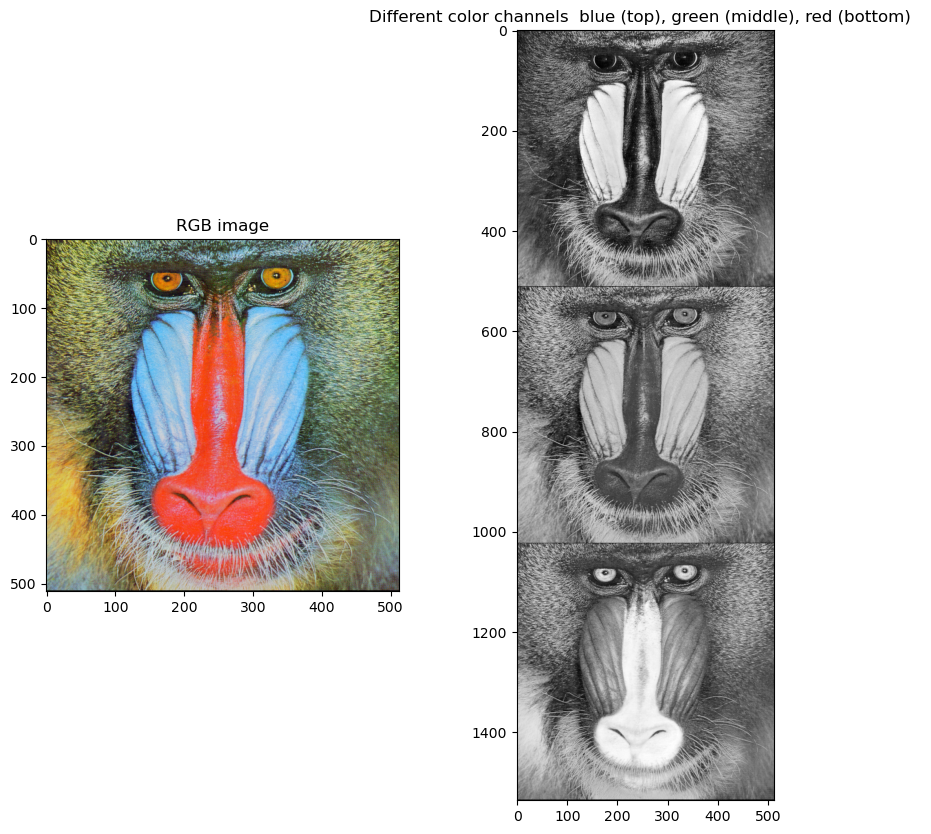

In [ ]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.subplot(121) #tạo subplot đầu tiên trong figure
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon sau khi chuyển đổi từ BGR sang RGB
plt.title("RGB image") #tiêu đề cho subplot đầu tiên
plt.subplot(122) #tạo subplot thứ hai trong figure
plt.imshow(im_bgr,cmap='gray') #hiển thị ảnh im_bgr với bản đồ màu xám
plt.title("Different color channels  blue (top), green (middle), red (bottom)  ") #tiêu đề cho subplot thứ hai
plt.show() #hiển thị figure chứa hai subplot

### Indexing  


We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [ ]:
rows = 256 #đặt số hàng cho ảnh mới

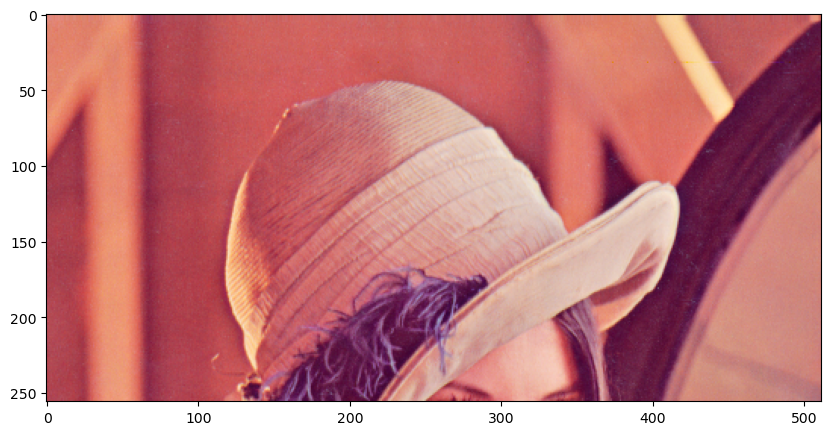

In [ ]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(new_image[0:rows,:,:]) #hiển thị ảnh mới lấy từ biến new_image với số hàng đã đặt
plt.show() #hiển thị figure chứa ảnh

We can also return the first 256 columns corresponding to the first half of the image:


In [77]:
columns = 256 #đặt số cột cho ảnh mới

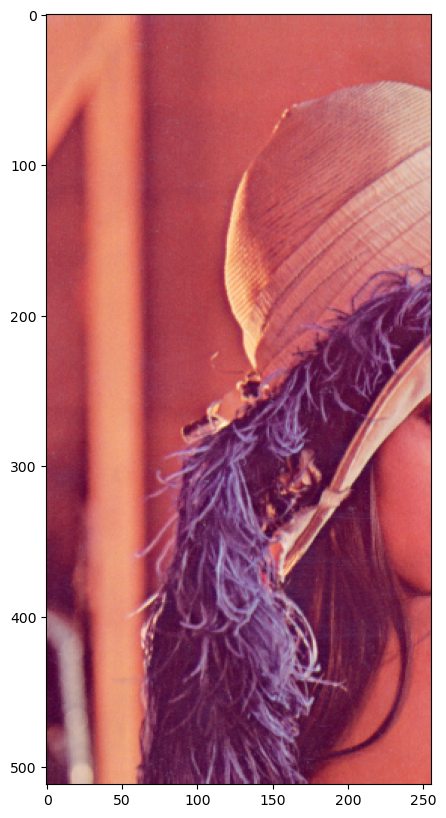

In [78]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(new_image[:,0:columns,:]) #hiển thị ảnh mới lấy từ biến new_image với số cột đã đặt
plt.show() #hiển thị figure chứa ảnh

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


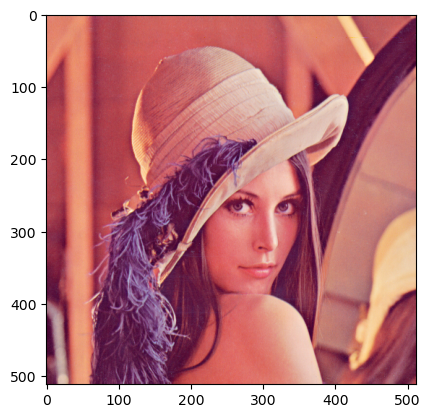

In [79]:
A = new_image.copy() #tạo bản sao của ảnh lưu trong biến new_image và lưu vào biến A
plt.imshow(A) #hiển thị ảnh lưu trong biến A
plt.show() #hiển thị figure chứa ảnh

If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


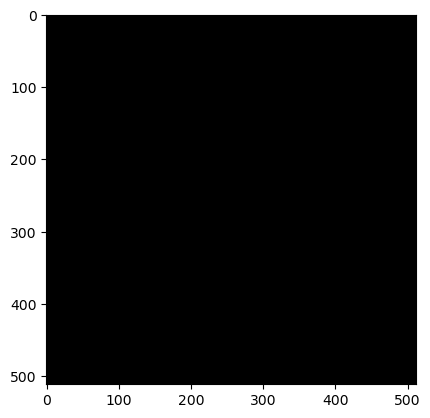

In [80]:
B = A #gán biến B tham chiếu đến mảng A
A[:,:,:] = 0 #đặt tất cả giá trị trong mảng A thành 0 (ảnh đen)
plt.imshow(B) #hiển thị ảnh lưu trong biến B
plt.show() #hiển thị figure chứa ảnh

We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


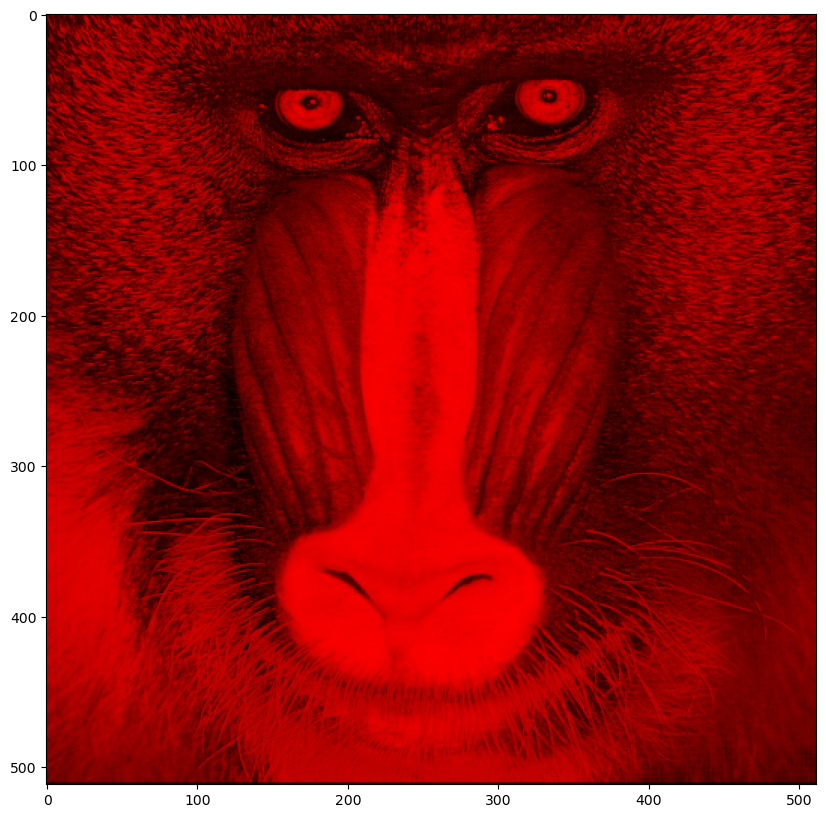

In [81]:
baboon_red = baboon.copy() #tạo bản sao của ảnh baboon và lưu vào biến baboon_red
baboon_red[:, :, 0] = 0 #đặt kênh màu xanh dương của ảnh baboon_red thành 0
baboon_red[:, :, 1] = 0 #đặt kênh màu xanh lá của ảnh baboon_red thành 0
plt.figure(figsize=(10, 10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_red sau khi chuyển đổi từ BGR sang RGB
plt.show() #hiển thị figure chứa ảnh

We can do the same for blue:  


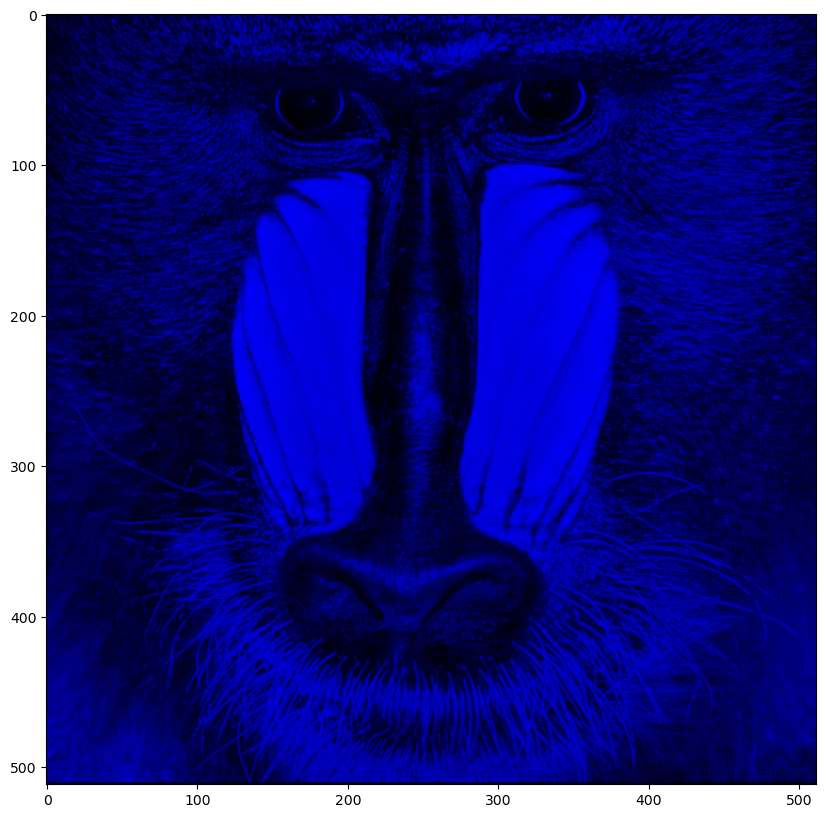

In [82]:
baboon_blue = baboon.copy() #tạo bản sao của ảnh baboon và lưu vào biến baboon_blue
baboon_blue[:, :, 1] = 0 #đặt kênh màu xanh lá của ảnh baboon_blue thành 0
baboon_blue[:, :, 2] = 0 #đặt kênh màu đỏ của ảnh baboon_blue thành 0
plt.figure(figsize=(10, 10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_blue sau khi chuyển đổi từ BGR sang RGB
plt.show() #hiển thị figure chứa ảnh

We can do the same for green:


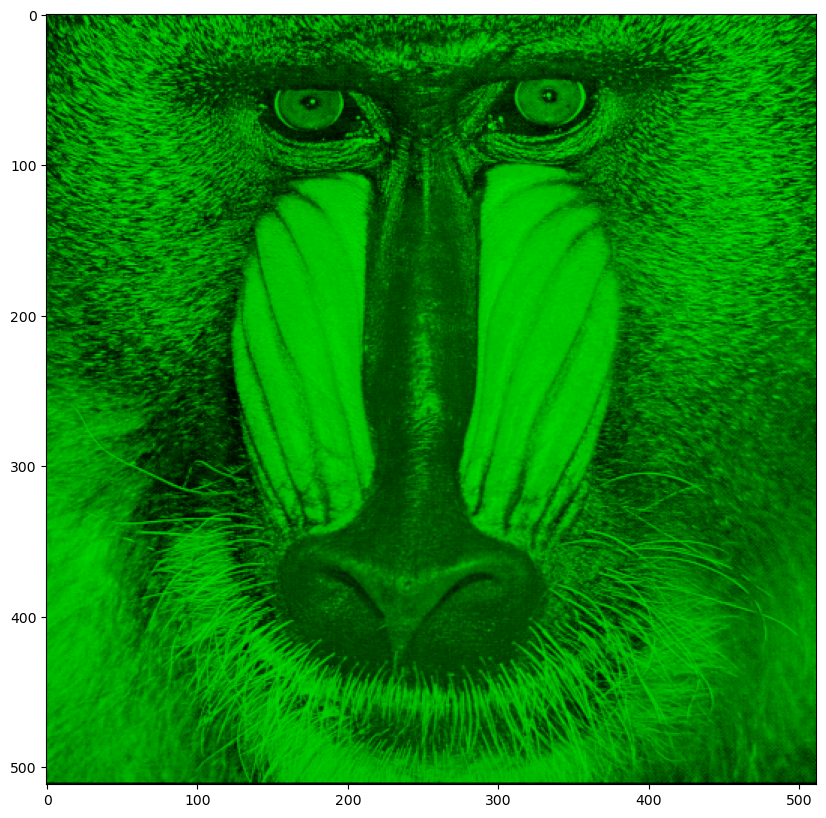

In [83]:
baboon_green = baboon.copy() #tạo bản sao của ảnh baboon và lưu vào biến baboon_green
baboon_green[:, :, 0] = 0 #đặt kênh màu xanh dương của ảnh baboon_green thành 0
baboon_green[:, :, 2] = 0 #đặt kênh màu đỏ của ảnh baboon_green thành 0
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_green sau khi chuyển đổi từ BGR sang RGB
plt.show() #hiển thị figure chứa ảnh

In [ ]:
image=cv2.imread('baboon.png') #đọc ảnh baboon.png và lưu vào biến image

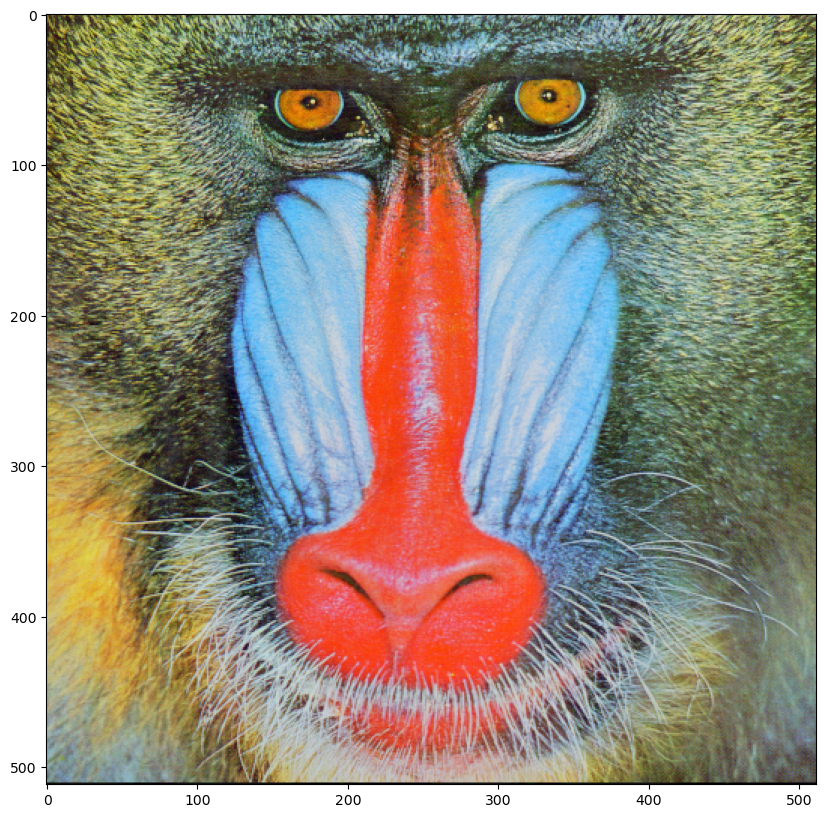

In [85]:
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) #hiển thị ảnh lưu trong biến image sau khi chuyển đổi từ BGR sang RGB
plt.show() #hiển thị figure chứa ảnh

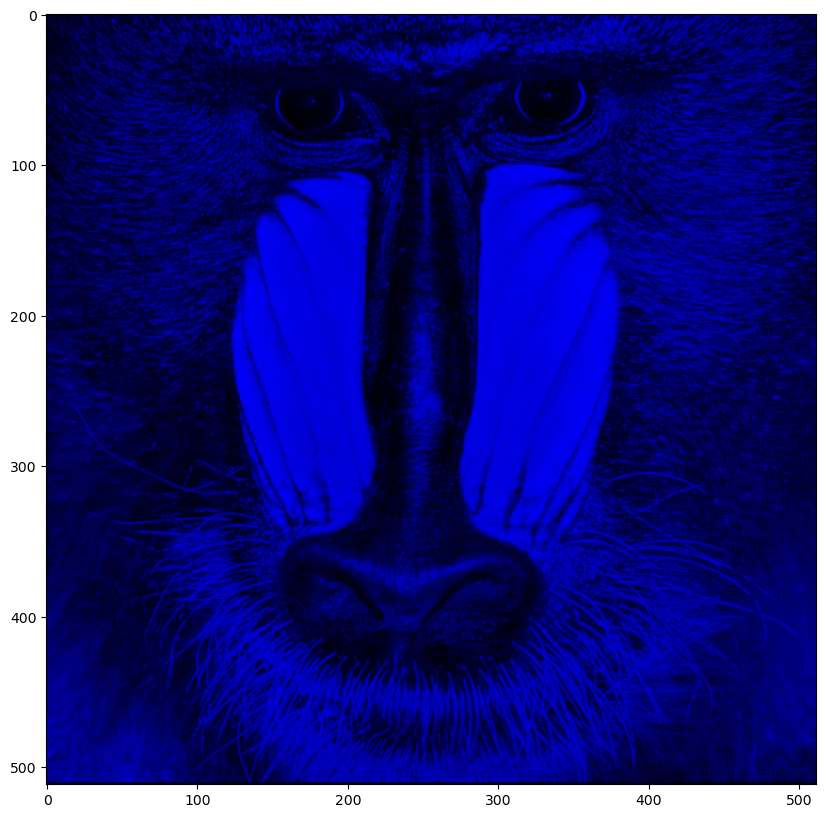

In [ ]:
image=cv2.imread('baboon.png') # replace and add you image here name 
baboon_blue=image.copy() #tạo bản sao của ảnh baboon và lưu vào biến baboon_blue
baboon_blue[:,:,1] = 0 #đặt kênh màu xanh lá của ảnh baboon_blue thành 0
baboon_blue[:,:,2] = 0 #đặt kênh màu đỏ của ảnh baboon_blue thành 0
plt.figure(figsize=(10,10)) #tạo một figure với kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_blue sau khi chuyển đổi từ BGR sang RGB
plt.show() #hiển thị figure chứa ảnh

### Question 1: 
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a OpenCV Image object called `baboon_blue`, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image


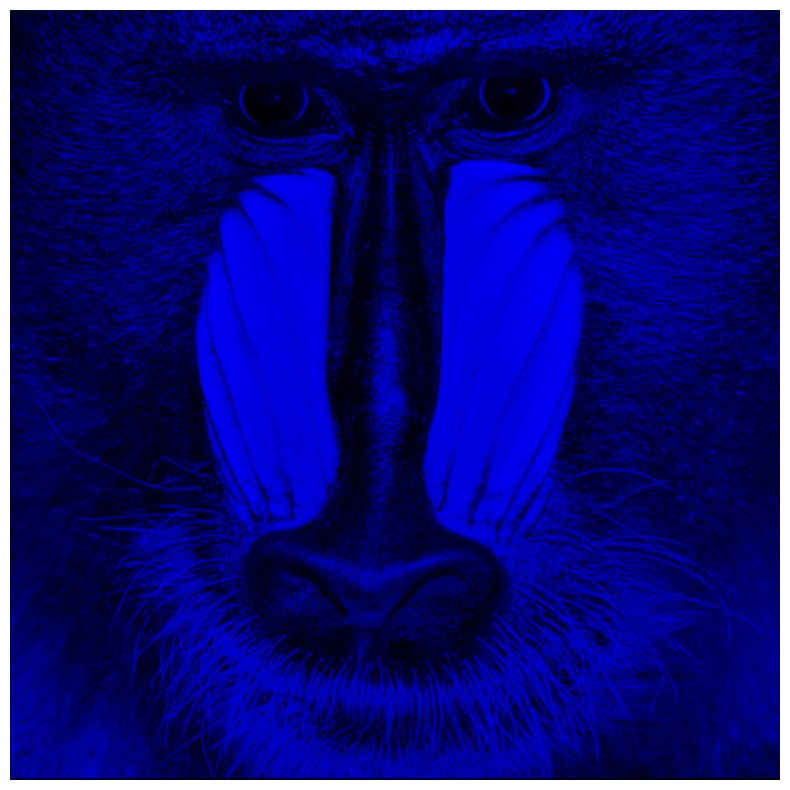

In [ ]:
import cv2
import matplotlib.pyplot as plt

#đọc ảnh baboon.png bằng OpenCV (ảnh ở hệ màu BGR)
image = cv2.imread('baboon.png')

#tạo bản sao của ảnh và lưu vào biến baboon_blue
baboon_blue = image.copy()

#chuyển ảnh từ hệ BGR sang RGB
baboon_blue = cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)

#giữ lại kênh màu xanh dương, đưa kênh đỏ và xanh lá về 0
baboon_blue[:, :, 0] = 0   # kênh đỏ
baboon_blue[:, :, 1] = 0   # kênh xanh lá

plt.figure(figsize=(10, 10))
plt.imshow(baboon_blue)
plt.show()


### So sánh 2 thư viện PIL và OpenCV
PIL:    

    Phù hợp học nhập môn, thao tác ảnh cơ bản
    Ảnh ở hệ màu RGB mặc định
    Kiểu dữ liệu: PIL.Image.Image
    Hiển thị nhanh bằng image.show()
    Chuyển xám, lượng tử hóa có sẵn (grayscale, quantize)
    Truy cập pixel qua image.load() (chậm)
    Code ngắn, dễ đọc, dễ hiểu

OpenCV:

    Phù hợp xử lý ảnh thực tế, chuyên sâu, hiệu năng cao, thị giác máy tính
    Ảnh ở hệ màu BGR
    Kiểu dữ liệu: numpy.ndarray
    Hiển thị bằng matplotlib (cần chuyển màu)
    Xử lý kênh màu bằng slicing ([:,:,i])
    Truy cập pixel trực tiếp bằng NumPy (rất nhanh)
    Tốc độ cao, dùng cho bài toán thực tế

Double-click **here** for a hint.

<!-- The hint is below:

baboon_blue[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

baboon_blue=cv2.imread('baboon.png')
baboon_blue=cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->
